In [1]:
# !unzip "/content/drive/MyDrive/DogVision/dog-breed-identification.zip" -d "/content/drive/MyDrive/DogVision/"

In [2]:
# import os
# len(os.listdir("drive/MyDrive/DogVision/train"))==len(filenames)

# 🐶 End-to-end Multi-Class Dog Breed Classification

This notebook builds an end-to-end multiclass image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of dog given an image of dog.

## 2. Data

From Kaggle's Dog breed classification competition https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

Multi Class Log Loss
prediction probabilities for each dog breed of each test image

## 4. Features

* We're dealing with images(unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds (classes) of dogs
* There are around 10000+ images in training set (labels)
* There are around 10000+ images in test set (without labels 'cause we're predicting them)

### Get our workspace ready

In [3]:
#import tensorflow to colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.15.0


In [4]:
import tensorflow_hub as hub
print("TF Hub version:",hub.__version__)

TF Hub version: 0.15.0


In [5]:
print("GPU","available (YESSSS!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSSS!!!)


In [6]:
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/DogVision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [8]:
labels_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [9]:
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

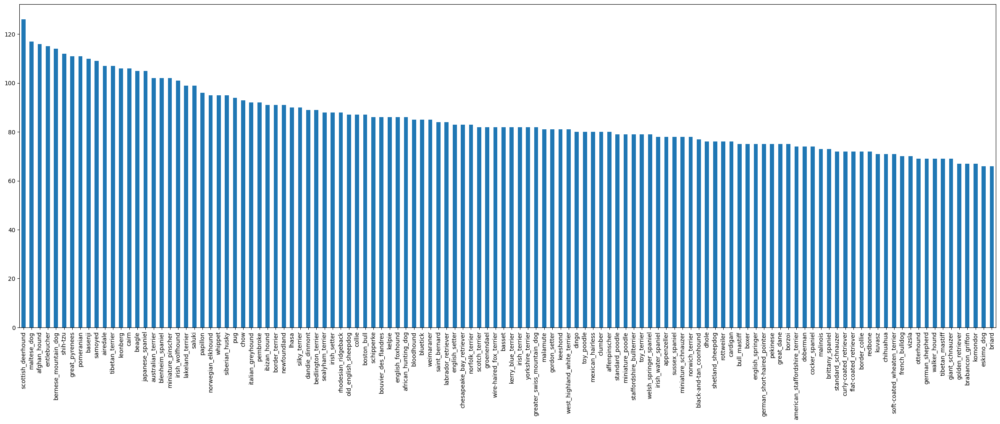

In [10]:
labels_csv["breed"].value_counts().plot(kind="bar",figsize=(30,10))

In [11]:
labels_csv["breed"].value_counts().median()

82.0

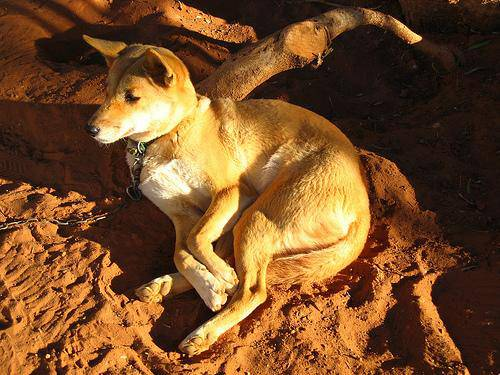

In [12]:
from IPython.display import Image
Image("drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [13]:
filenames=["drive/MyDrive/DogVision/train/"+labels+".jpg" for labels in labels_csv["id"]]

In [14]:
filenames

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/DogVision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/DogVision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/DogVision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/DogVision/train/006cc3ddb9dc1bd827479569fcdc52dc.jpg',
 'driv

In [15]:
import os
if len(os.listdir("drive/MyDrive/DogVision/train/"))==len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")
print(len(os.listdir("drive/MyDrive/DogVision/train/")),len(filenames))

Filenames match actual amount of files!!! Proceed.
10222 10222


In [16]:
...

Ellipsis

In [17]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
# labels=np.array(label)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [18]:
import this

The Zen of Python, by Tim Peters

Beautiful is better than ugly.
Explicit is better than implicit.
Simple is better than complex.
Complex is better than complicated.
Flat is better than nested.
Sparse is better than dense.
Readability counts.
Special cases aren't special enough to break the rules.
Although practicality beats purity.
Errors should never pass silently.
Unless explicitly silenced.
In the face of ambiguity, refuse the temptation to guess.
There should be one-- and preferably only one --obvious way to do it.
Although that way may not be obvious at first unless you're Dutch.
Now is better than never.
Although never is often better than *right* now.
If the implementation is hard to explain, it's a bad idea.
If the implementation is easy to explain, it may be a good idea.
Namespaces are one honking great idea -- let's do more of those!


In [19]:
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [20]:
len(unique_breeds)

120

In [21]:
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [22]:
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [23]:
print(labels[0])
print(np.where(unique_breeds==labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [25]:
filenames[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [26]:
X=filenames
Y=boolean_labels

In [27]:
len(X),len(Y)

(10222, 10222)

In [28]:
# set number of images to use for experimenting
num_images=1000 #@param{type:"slider",min:1000,max:10000}

In [29]:
from sklearn.model_selection import train_test_split
xtrain,xval,ytrain,yval=train_test_split(X[:num_images],Y[:num_images],test_size=0.2,random_state=42)
len(xtrain),len(ytrain),len(xval),len(yval)

(800, 800, 200, 200)

In [30]:
xtrain[:5],ytrain[:2]

(['drive/MyDrive/DogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/DogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/DogVision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/DogVision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/DogVision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

## PREPROCESSING

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

In [31]:
# Convert image to np array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [32]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [33]:
image.max(),image.min()

(255, 0)

In [34]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [35]:
# Define image size
isize=224
# create a function
def process_image(image_path,img_size=isize):
  """
  Takes an image file path and turns the image into a tensor
  """
  # Read in an image file
  image=tf.io.read_file(image_path)
  # Turn the jpeg image into Tensor with 3 colour channels (Red, Green, Blue)
  image=tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired value (224,224)
  image=tf.image.resize(image,size=[img_size,img_size])

  return image

## Turning our data into batches

Why turn our data into batches,
let's say you are trying to process 10,000+ images in one go... they all might not fit into the memory.

So that's why we do about 32 (batch size) images at a time (we can manually the batch size if needed).

In order to use TensorFlow effectively, we ned our data in the form of Tensor tuples which looks like this: (image, label).

In [36]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple if (image, label)
  """
  image=process_image(image_path)
  return image,label

In [37]:
#Demo of the above
(process_image(X[42]), tf.constant(Y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

now we've got a way to turn our data into tuples of tensors in the form: (image,label)
lets make a function to turn all of our data (x & y) into batches

In [142]:
# define the batch size: 32 is a good start
batch_size=32
# a function to turn data into batches
def create_data_batches(X,Y=None,batch_size=batch_size,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (Y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is a test dataset, we probably dont have labels
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(process_image).batch(batch_size)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                             tf.constant(Y)))   # labels
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(Y)))
    data=data.shuffle(buffer_size=len(X))
    data=data.map(get_image_label)
    data_batch=data.batch(batch_size)
    return data_batch


In [39]:
# Create training and validation data batches
train_data=create_data_batches(xtrain,ytrain)
val_data=create_data_batches(xval,yval,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [40]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualising Data Batches

Our data is now in batchs, however these can be a little hard to understand/comprehend, let's visualise the data

In [41]:
import matplotlib.pyplot as plt

def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

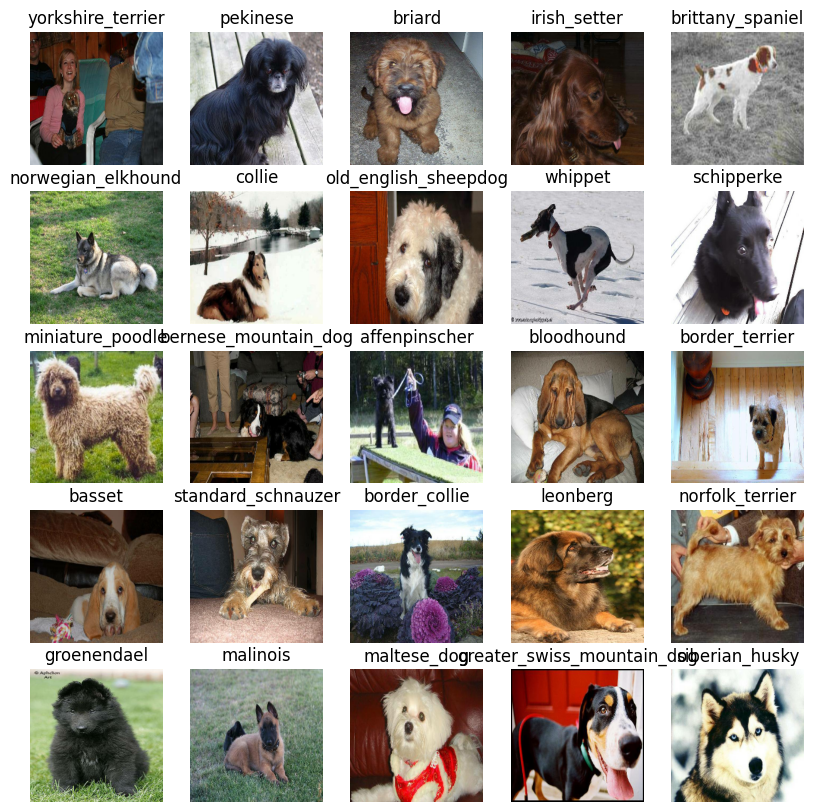

In [42]:
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

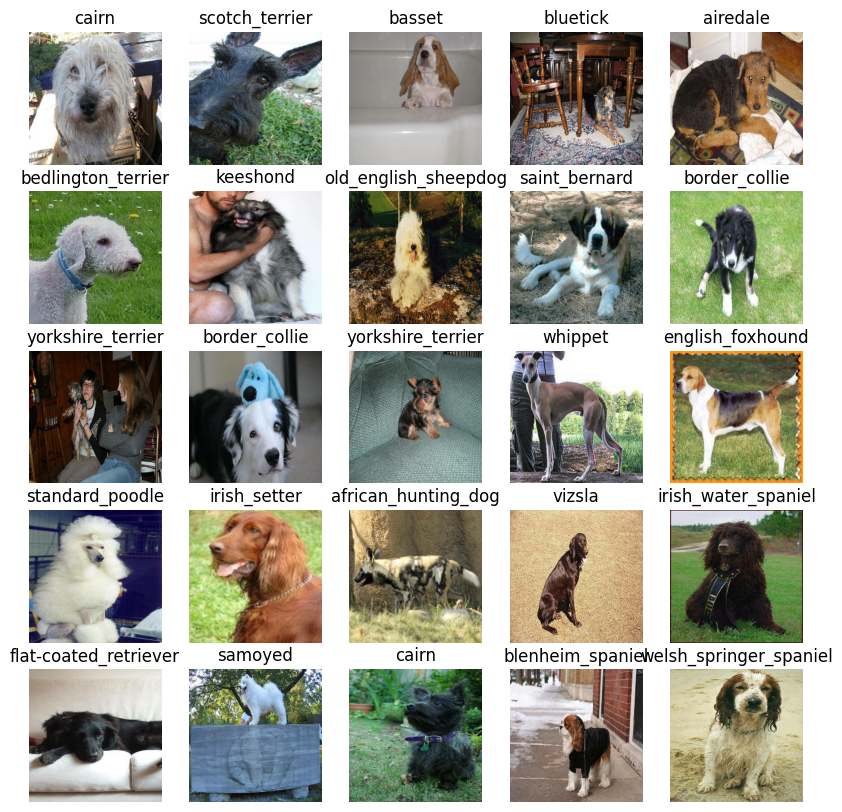

In [43]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model
* The output shape (image labels, in the form of Tensors) of our model
* The URL of the model we want to use. "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [44]:
# setup input shape to model
input_shape=[None,isize,isize,3]

# setup the output shape
output_shape=len(unique_breeds)

# Setup model URL from TensorFlow Hub
model_url="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras Deep Learning Model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that)..
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [45]:
# Create a function which builds a Keras model
def create_model(input_shape=input_shape,output_shape=output_shape,model_url=model_url):
  print("Building model with:",model_url)

  # Setup the model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(model_url), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=output_shape,
                            activation="softmax")
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(input_shape)

  return model

In [46]:
model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [47]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during trainingto do such things as save its's progress, check its progress or stop training early if a model stops improving

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extention.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualise our models training logs with the `%tensorboard` magic function (we'll do this after model training)

In [48]:
# Load TensorBoard notebook extention
%load_ext tensorboard

In [49]:
import datetime

# create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # create av log directory for storing TensorBoard logs
  logdir=os.path.join("drive/My Drive/DogVision/logs",
                      #Make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Helps our model to prevent overfitting.

In [50]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [130]:
num_epochs=100 #@param {type:"slider",min:10,max:100,step:5}

In [52]:
print("GPU available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Lets create a function that trains a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [53]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #Create a model
  model=create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  # Fir the model to the data passing it the callbacks we've created
  model.fit(x=train_data,
            epochs=num_epochs,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  #return the fitted model
  return model

In [54]:
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/25
25/25 [==============================] - 137s 5s/step - loss: 4.6478 - accuracy: 0.1063 - val_loss: 3.4182 - val_accuracy: 0.2550
Epoch 2/25
25/25 [==============================] - 3s 105ms/step - loss: 1.6698 - accuracy: 0.6675 - val_loss: 2.1650 - val_accuracy: 0.4900
Epoch 3/25
25/25 [==============================] - 3s 141ms/step - loss: 0.5906 - accuracy: 0.9287 - val_loss: 1.6829 - val_accuracy: 0.6000
Epoch 4/25
25/25 [==============================] - 2s 93ms/step - loss: 0.2610 - accuracy: 0.9850 - val_loss: 1.4982 - val_accuracy: 0.6550
Epoch 5/25
25/25 [==============================] - 3s 126ms/step - loss: 0.1500 - accuracy: 0.9975 - val_loss: 1.4181 - val_accuracy: 0.6400
Epoch 6/25
25/25 [==============================] - 3s 138ms/step - loss: 0.1032 - accuracy: 0.9987 - val_loss: 1.3711 - val_accuracy: 0.6550
Epoch 7/25
25/25 [==============================] - 3s 11

In [55]:
#overfitting

## Checking TensorBoard Logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualise its contents

In [56]:
%tensorboard --logdir drive/MyDrive/DogVision/logs

<IPython.core.display.Javascript object>

## Making Predictions and evaluating

In [57]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [58]:
#Making predictions on validation dataset (not used for training)
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 1s 82ms/step


array([[3.80487647e-03, 7.08038060e-05, 3.22440086e-04, ...,
        1.88066522e-04, 1.33217080e-04, 2.90477416e-03],
       [3.94817907e-03, 8.50974931e-04, 1.55539606e-02, ...,
        1.25038589e-03, 8.91849492e-03, 4.67397069e-04],
       [1.61020284e-06, 1.33303882e-04, 9.86492068e-06, ...,
        1.00167024e-04, 2.84379021e-05, 4.60845651e-04],
       ...,
       [3.03188626e-05, 2.56681978e-05, 5.24646661e-04, ...,
        7.84290460e-05, 1.05093583e-03, 2.10328639e-04],
       [5.03528723e-03, 3.63215164e-04, 1.03750055e-04, ...,
        3.41378473e-05, 5.20830508e-05, 6.81289285e-03],
       [1.29802083e-03, 4.46580816e-05, 1.04336278e-03, ...,
        6.81203650e-03, 2.27941578e-04, 4.20433294e-04]], dtype=float32)

In [59]:
predictions.shape

(200, 120)

In [60]:
len(yval), len(unique_breeds)

(200, 120)

In [61]:
np.sum(predictions[0])

1.0000001

In [62]:
predictions[0]

array([3.80487647e-03, 7.08038060e-05, 3.22440086e-04, 2.21265815e-04,
       8.60260974e-04, 6.83491235e-05, 5.48558235e-02, 1.16892322e-03,
       9.04332701e-05, 1.04750937e-03, 5.11256570e-04, 2.88119863e-05,
       2.95293285e-04, 2.37970409e-04, 4.79571463e-04, 1.21122214e-03,
       3.67951347e-04, 2.05296278e-01, 9.20253387e-06, 6.61240425e-04,
       4.42005042e-03, 1.84558827e-04, 8.93328252e-05, 3.43794731e-04,
       9.58781602e-05, 1.38693256e-03, 8.77569541e-02, 8.87164861e-05,
       6.72028679e-03, 3.50525661e-04, 9.68872700e-05, 4.33086912e-04,
       1.84448680e-03, 1.04612816e-04, 1.41952274e-04, 7.17660785e-02,
       4.63263859e-05, 2.51711928e-04, 2.82396795e-05, 3.80612822e-04,
       1.15807797e-03, 7.57326416e-05, 3.73794552e-04, 1.45257130e-04,
       8.65767506e-05, 4.20650431e-05, 2.56830303e-04, 1.85771627e-04,
       1.73725202e-04, 3.69802059e-04, 4.95547429e-04, 1.00402918e-04,
       2.55859486e-04, 2.56061739e-05, 2.15993699e-04, 1.54929759e-04,
      

In [63]:
#First Prediction
index=42
print(predictions[index])
print(f"max value (probability of the function): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.11912619e-05 3.82496801e-04 1.45354948e-04 4.61579693e-05
 3.44364019e-03 8.95303529e-05 2.06407101e-04 1.38388760e-03
 4.01778659e-03 7.11067580e-03 4.73763903e-05 4.51414671e-05
 1.37779512e-03 2.99629266e-03 1.55718171e-03 1.74923602e-03
 2.82723515e-04 6.01171749e-04 4.43429512e-04 1.65052144e-04
 1.01626341e-04 2.17063236e-03 1.16617346e-04 8.75459955e-05
 1.41289132e-02 9.51498077e-05 6.63336032e-05 1.32716377e-04
 2.81256653e-04 2.65651033e-04 2.27248514e-04 1.81436713e-04
 9.89375912e-05 1.48051913e-05 3.08828865e-04 6.81822567e-05
 1.25233186e-04 3.07278446e-04 5.84098780e-05 4.31147963e-01
 8.60513654e-04 2.95470709e-05 1.03540989e-02 2.61964105e-05
 1.11005339e-03 4.97865803e-05 1.54407739e-04 3.01303249e-03
 2.26539651e-05 3.41057632e-04 1.18565229e-04 2.08581099e-04
 7.12594658e-04 1.40458043e-03 9.03662731e-05 1.84925192e-03
 1.26535993e-03 2.19200883e-04 3.17881408e-04 1.43475307e-04
 4.00979952e-05 1.53279791e-04 5.33741004e-05 1.29945140e-04
 1.06920139e-04 1.669585

In [64]:
unique_breeds[113]

'walker_hound'

Having the bove functioanlity is great but we want to be able to do it at scale.

And it would be even better if we could see the image prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [65]:
#Turn prediction probabilities to their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label=get_pred_label(predictions[7])
pred_label

'old_english_sheepdog'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [66]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [71]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images=[]
  labels=[]
  #loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

#Unbatchify the validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [74]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediciton, ground truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label=get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  # Change plot title to be predicted, probability of prediction and label
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

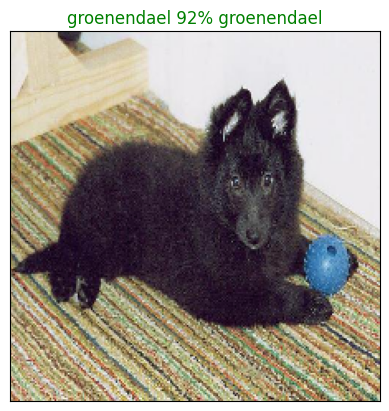

In [78]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=77)

 Now we've got one function to visualise our models top prediction, let's make another to view our models top 10 predictions
 This function will:
 * Take an input of prediction probabilities array and a ground truth array and an integer
 * Find the prediction using `get_pred_label()`
 * Find the top 10:
      * Prediction probabilties indexes
      * Prediction probabilities values
      * Prediction labels
 * Plot the top 10 prediction probability values and labels, coloring the true label green

In [98]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for the sample n
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label=get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

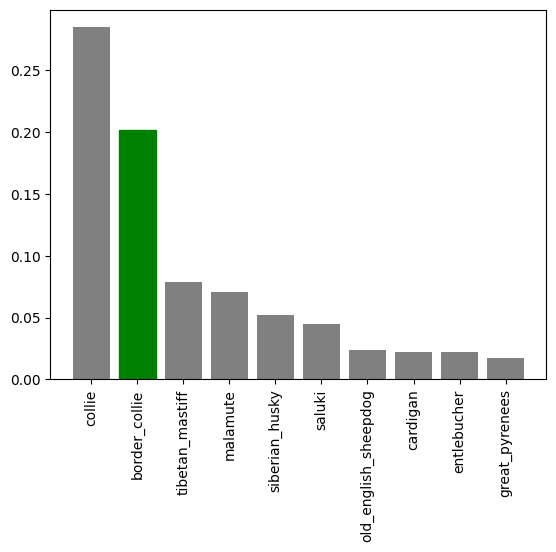

In [99]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,n=9)

Now we've got some function to help us visualize our predictions and evaluate out model, let's check out

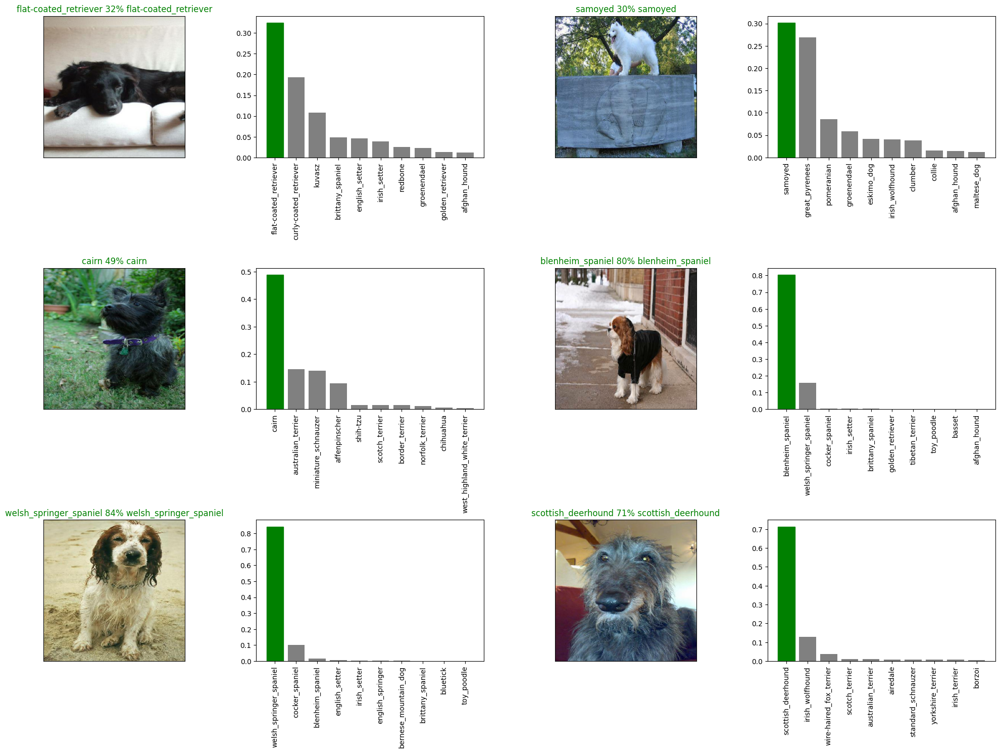

In [105]:
# Let's check out a few predictions and their different values
i_multiplier=20
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [108]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  #Create a model directory pathname with current time
  modeldir=os.path.join("drive/MyDrive/DogVision/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+"-"+suffix+".h5" #save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [113]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [114]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DogVision/models/20231224-11471703418442-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/DogVision/models/20231224-11471703418442-1000-images-mobilenetv2-Adam.h5'

In [115]:
# Load a trained model
loaded_1000_image_model=load_model("drive/MyDrive/DogVision/models/20231224-11391703417980-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/DogVision/models/20231224-11391703417980-1000-images-mobilenetv2-Adam.h5


In [117]:
# Evaluate the pre saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 61ms/step - loss: 1.3444 - accuracy: 0.6450


[1.344406247138977, 0.6449999809265137]

In [118]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 88ms/step - loss: 1.3444 - accuracy: 0.6450


[1.344406247138977, 0.6449999809265137]

## Training a big dog model (on full dog data)

In [121]:
len(X),len(Y)

(10222, 10222)

In [122]:
X[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [123]:
len(xtrain)

800

In [124]:
# Create a data batch with the full dataset
full_data=create_data_batches(X,Y)

Creating training data batches...


In [125]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [126]:
# Create a model for full model
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [127]:
# Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

**Note:** Running the cell below will take a little while (maybe upto 30 mins for the first epoch) because the GPU we're using in the runtime has to load all of the images into the memory.

In [131]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=num_epochs,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 29s 90ms/step - loss: 0.6630 - accuracy: 0.8108
Epoch 2/100
320/320 [==============================] - 26s 80ms/step - loss: 0.3294 - accuracy: 0.9064
Epoch 3/100
320/320 [==============================] - 27s 84ms/step - loss: 0.2009 - accuracy: 0.9480
Epoch 4/100
320/320 [==============================] - 27s 83ms/step - loss: 0.1343 - accuracy: 0.9696
Epoch 5/100
320/320 [==============================] - 27s 84ms/step - loss: 0.0945 - accuracy: 0.9813
Epoch 6/100
320/320 [==============================] - 24s 76ms/step - loss: 0.0683 - accuracy: 0.9895
Epoch 7/100
320/320 [==============================] - 24s 76ms/step - loss: 0.0528 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 24s 76ms/step - loss: 0.0420 - accuracy: 0.9958
Epoch 9/100
320/320 [==============================] - 27s 83ms/step - loss: 0.0339 - accuracy: 0.9966
Epoch 10/100
320/320 [==============================] - 27s 83ms/step - l

In [132]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DogVision/models/20231224-12191703420345-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/DogVision/models/20231224-12191703420345-full-image-set-mobilenetv2-Adam.h5'

In [134]:
# Load the full model
loaded_full_model=load_model('drive/MyDrive/DogVision/models/20231224-12191703420345-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/DogVision/models/20231224-12191703420345-full-image-set-mobilenetv2-Adam.h5


## Making predictions on test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches

To make predictions on test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to True (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [135]:
# Load test image filenames
test_path="drive/MyDrive/DogVision/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/DogVision/test/e423b91111a1c5b52cc1026086f263f2.jpg',
 'drive/MyDrive/DogVision/test/e07106e5301fbce05cade5c94f775a72.jpg',
 'drive/MyDrive/DogVision/test/debfa5cad80e35c510dff6ca29b94ca3.jpg',
 'drive/MyDrive/DogVision/test/e67cd079a0f9c15ebee3c41743906c73.jpg',
 'drive/MyDrive/DogVision/test/e1adb64372b1784c01401cb73bb20807.jpg',
 'drive/MyDrive/DogVision/test/df645ae75554d4d7130bfa1b72be53ce.jpg',
 'drive/MyDrive/DogVision/test/e05367db91d0449b2afe76a1b7acc1c8.jpg',
 'drive/MyDrive/DogVision/test/e50319e7efc447bb684fbfdbed3ff041.jpg',
 'drive/MyDrive/DogVision/test/e062ea256ada165dfe998fbc6529dff7.jpg',
 'drive/MyDrive/DogVision/test/dd9d222a481e6cbea922a1b601a55a38.jpg']

In [136]:
len(test_filenames)

10357

In [143]:
# Create test data batch
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [144]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1hr).

In [145]:
# Make predictions on test data batch using the loaded full mdoel
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 1150s 4s/step


In [148]:
# Save predictions (NP array) to csv file (for acess later)
np.savetxt("drive/MyDrive/DogVision/preds_array.csv",test_predictions,delimiter=",")

In [149]:
# Load predictions (NP array) from csv file
test_predictions=np.loadtxt("drive/MyDrive/DogVision/preds_array.csv",delimiter=",")

## Preparing test dataset for submission for kaggle

Looking atr the kaggle sample submission, we find that it wants our model's prediction probability outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas dataframe with an ID column as well as a column for each dog breed
* Add data to the id column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle

In [150]:
# ["id"]+list(unique_breeds)

In [151]:
# Create a pandas DataFrame with empty columns
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [155]:
# Append test image ID's to predictions DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [156]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e423b91111a1c5b52cc1026086f263f2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e07106e5301fbce05cade5c94f775a72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,debfa5cad80e35c510dff6ca29b94ca3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e67cd079a0f9c15ebee3c41743906c73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1adb64372b1784c01401cb73bb20807,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [157]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e423b91111a1c5b52cc1026086f263f2,4.016638e-12,2.022326e-11,2.264579e-10,1.633627e-11,6.415201e-09,4.281959e-11,2.852744e-14,3.573305e-11,2.872182e-09,...,4.585435e-10,4.602376e-12,1.957694e-07,1.177735e-07,4.955215e-08,1.760203e-12,2.327106e-11,7.072062e-07,3.059559e-11,1.754596e-11
1,e07106e5301fbce05cade5c94f775a72,9.365574e-10,4.525103e-07,5.565961e-11,1.873332e-05,1.071965e-10,1.368595e-10,1.312683e-09,2.096363e-08,2.998235e-13,...,7.222279e-09,6.121398e-08,9.244093e-10,1.310746e-07,9.794549e-12,7.674143e-09,4.811950e-08,1.131481e-07,9.993063e-01,7.221039e-09
2,debfa5cad80e35c510dff6ca29b94ca3,2.010210e-09,6.044367e-07,5.376256e-10,2.713990e-07,5.603320e-09,2.001285e-09,5.544891e-08,4.093452e-07,7.449091e-09,...,5.823609e-09,2.706896e-10,2.203489e-09,1.920215e-08,8.188986e-09,4.080364e-07,3.023266e-09,5.315531e-08,3.075000e-06,4.805112e-09
3,e67cd079a0f9c15ebee3c41743906c73,1.192326e-11,2.638098e-09,6.524200e-10,8.355436e-11,5.603616e-08,7.859500e-14,1.265139e-09,4.777925e-10,4.115107e-10,...,1.766090e-08,7.012301e-13,6.384890e-11,3.008496e-09,4.967561e-11,3.210247e-12,1.543180e-06,4.322591e-10,9.567135e-06,4.544334e-10
4,e1adb64372b1784c01401cb73bb20807,6.849593e-08,1.191383e-10,5.794059e-11,3.595278e-09,1.837725e-12,2.296383e-09,2.921194e-10,4.951343e-13,3.914634e-12,...,9.169399e-09,7.977768e-12,1.174646e-09,4.704257e-09,6.045776e-06,1.028727e-13,8.775787e-14,7.745600e-09,2.627672e-14,5.998813e-12


In [158]:
preds_df.to_csv("drive/MyDrive/DogVision/full_model_predictions_submission_1_mobilenetv2.csv",index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()` and since our custom images won't have labels, we set the `test_data` parameter to be True.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images

In [164]:
# Get custom image filepaths
custom_path="/content/drive/MyDrive/DogVision/custom_preds/"
custom_image_paths=[custom_path+fname for fname in os.listdir(custom_path)]

In [166]:
custom_image_paths

['/content/drive/MyDrive/DogVision/custom_preds/Labrador_on_Quantock_(2175262184).jpg']

In [167]:
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [168]:
# Make predictions on the custom data
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 985ms/step


In [169]:
custom_preds.shape

(1, 120)

In [170]:
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['english_foxhound']

In [171]:
# Get custom images
custom_images=[]
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

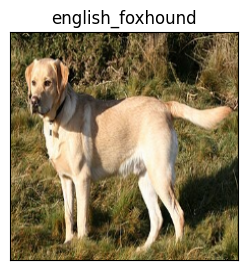

In [172]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)